# ML1 - 1.3 Optimization in Relation to Problem Solving Part 2

### This script contains the following:

### Part 1:
#### 1. Importing Libraries
#### 2. Data Cleaning
#### 3a. Gradient Descent (MADRID/1973)
#### 3b. Graident Descent (GDANSK/1997)
#### 4. Exporting
### Part 2:
#### 1. Importing Libraries
#### 3c. Graident Descent (OSLO/2022)
#### 3d. Graident Descent (DEBILT/2022)
#### 4. Exporting

In [86]:
# Importing Libraries

import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d

from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

In [88]:
# Importing scaled dataframe as csv

climatewins_df = pd.read_pickle(r'D:\Career Foundry\3) Data Specialization\Machine Learning with Python\Achievement 1 - Basics of Machine Learning for Analysts\ClimateWins\Prepared Python Files\ML1_1.3_scaled_og_DATE_column.pkl')

In [90]:
# Creating Path

path = r'D:\Career Foundry\3) Data Specialization\Machine Learning with Python\Achievement 1 - Basics of Machine Learning for Analysts'

In [92]:
path

'D:\\Career Foundry\\3) Data Specialization\\Machine Learning with Python\\Achievement 1 - Basics of Machine Learning for Analysts'

### 2. Data Cleaning

In [95]:
climatewins_df

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,-1.599964,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,...,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237
1,19600102,-1.599964,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,...,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141
2,19600103,-1.599964,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,...,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078
3,19600104,-1.599964,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,-0.114186,...,0.783085,0.480538,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-0.998679,-0.164486,-0.838511
4,19600105,-1.599964,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,0.187388,...,-1.670486,-0.363113,1.729970,-0.794645,-0.490810,-0.024706,0.672505,-1.509396,-1.339569,-1.471186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,1.013583,-1.833187,-0.02793,0.284075,1.037367,-0.005632,-0.004619,-0.179228,0.720943,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530
22946,20221028,1.013583,0.244897,-0.02793,0.103401,0.976231,-0.005632,-0.004619,-0.179228,0.187388,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530
22947,20221029,1.013583,-0.586336,-0.02793,0.013064,0.716402,-0.005632,-0.004619,-0.179228,0.349774,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530
22948,20221030,1.013583,-0.170720,-0.02793,0.374412,0.487141,-0.005632,-0.004619,-0.179228,0.280180,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530


In [97]:
climatewins_df.shape

(22950, 170)

In [99]:
# Selecting only mean temperatures

mean_temps_datemonth = climatewins_df[['DATE', 'MONTH','BASEL_temp_mean',
 'BELGRADE_temp_mean',
 'BUDAPEST_temp_mean',
 'DEBILT_temp_mean',
 'DUSSELDORF_temp_mean',
 'GDANSK_temp_mean',
 'HEATHROW_temp_mean',
 'KASSEL_temp_mean',
 'LJUBLJANA_temp_mean',
 'MAASTRICHT_temp_mean',
 'MADRID_temp_mean',
 'MUNCHENB_temp_mean',
 'OSLO_temp_mean',
 'ROMA_temp_mean',
 'SONNBLICK_temp_mean',
 'STOCKHOLM_temp_mean',
 'TOURS_temp_mean',
 'VALENTIA_temp_mean']].copy()

In [101]:
mean_temps_datemonth

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,-1.599964,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,-1.599964,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,-1.599964,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,-1.599964,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,-1.599964,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,1.013583,0.747959,0.628750,-0.005167,0.898267,1.042841,0.440753,0.906865,-0.005705,0.481853,1.268193,0.683127,0.664244,0.395898,-0.000746,0.826301,0.517090,1.295755,-0.007287
22946,20221028,1.013583,0.856604,0.367720,-0.005167,0.945734,1.278467,0.466330,0.802037,-0.005705,0.263891,1.313202,0.561815,0.890456,0.541516,-0.000746,1.074927,0.641496,1.358505,-0.007287
22947,20221029,1.013583,0.856604,0.083991,-0.005167,0.914089,1.101748,0.786039,0.924336,-0.005705,0.300218,1.208181,0.548336,1.053832,0.395898,-0.000746,1.221178,0.716139,1.405568,-0.007287
22948,20221030,1.013583,0.680055,0.265577,-0.005167,0.692578,0.880848,0.376811,0.697210,-0.005705,0.397090,0.923123,0.103526,0.689378,-0.065226,-0.000746,1.235803,0.019467,0.668249,-0.007287


### 3b. Gradient Descent (OSLO/1997)

In [104]:
# Reducing dataset to a single year

climate_1997 = mean_temps_datemonth[mean_temps_datemonth['DATE'].astype(str).str.contains('1997')]

In [106]:
climate_1997

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
13515,19970101,-1.599964,-2.850915,-1.902110,-2.287267,-3.389558,-3.669680,-3.331811,-2.447619,-3.475840,-2.230563,-3.757828,-1.527444,-2.465033,-2.176691,-0.522731,-1.440589,-1.747095,-3.159533,-3.071588
13516,19970102,-1.599964,-2.837334,-1.731872,-1.875548,-3.579424,-3.728587,-1.950669,-2.395205,-3.239576,-1.939947,-3.232722,-1.500486,-2.113146,-1.800510,-0.388025,-1.016461,-1.784417,-3.096782,-3.071588
13517,19970103,-1.599964,-2.253366,-1.346001,-1.640280,-2.804135,-2.535730,-2.487780,-2.377734,-2.456949,-1.758312,-2.647603,-1.675714,-1.786395,-2.455792,-0.219643,-0.826335,-1.995907,-2.610466,-3.852684
13518,19970104,-1.599964,-1.995334,-1.153066,-1.275614,-2.234535,-2.300104,-3.037679,-2.080723,-2.250218,-1.395042,-2.302533,-1.635277,-1.535047,-2.528601,-0.910009,-0.723959,-1.784417,-2.375151,-4.032937
13519,19970105,-1.599964,-1.723721,-1.334652,-1.228561,-2.424402,-2.138111,-2.270378,-1.818653,-2.220685,-1.189189,-2.197511,-2.012691,-1.409373,-2.043207,-1.246774,-1.074962,-1.274353,-2.328088,-3.251841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13875,19971227,1.594371,-0.555784,-0.494815,-0.581573,-0.573200,-0.694901,-0.390490,-0.927619,-0.670199,-0.838028,-0.577182,-1.042197,-0.630196,-1.145228,-1.044715,-0.957961,-1.050423,-0.727950,-1.028721
13876,19971228,1.594371,-0.868139,-0.937432,-0.675681,-0.747245,-0.783261,-0.761352,-1.259573,-0.891697,-1.055990,-0.787225,-1.406132,-0.843841,-0.987475,-1.465670,-1.323588,-1.299234,-1.292705,-1.239016
13877,19971229,1.594371,-1.234817,-0.926083,-0.863895,-0.699778,-0.842167,-0.799717,-0.962561,-0.876931,-1.225516,-0.892246,-1.136550,-1.032352,-0.902531,-1.549861,-1.499089,-0.702087,-0.790700,-1.148890
13878,19971230,1.594371,-1.139752,-0.892036,-0.993293,-0.699778,-0.694901,-1.004331,-0.578193,-0.847397,-1.140753,-0.652197,-0.840010,-0.969515,-0.914666,-1.330965,-1.074962,-0.702087,-0.665199,-0.397835


In [108]:
# Decide which weather station to use and create a 3d Model of temperatures for that year.
# Drop MONTH as it is not scaled and not necessary. Keep DATE for my selected year of 1997. My selected weather
# station will be Oslo.

climate_1997_df = climate_1997.drop('MONTH', axis = 1)

In [110]:
climate_1997_df.head()

,DATE,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
13515,19970101,-2.850915,-1.902110,-2.287267,-3.389558,-3.669680,-3.331811,-2.447619,-3.475840,-2.230563,-3.757828,-1.527444,-2.465033,-2.176691,-0.522731,-1.440589,-1.747095,-3.159533,-3.071588
13516,19970102,-2.837334,-1.731872,-1.875548,-3.579424,-3.728587,-1.950669,-2.395205,-3.239576,-1.939947,-3.232722,-1.500486,-2.113146,-1.800510,-0.388025,-1.016461,-1.784417,-3.096782,-3.071588
13517,19970103,-2.253366,-1.346001,-1.640280,-2.804135,-2.535730,-2.487780,-2.377734,-2.456949,-1.758312,-2.647603,-1.675714,-1.786395,-2.455792,-0.219643,-0.826335,-1.995907,-2.610466,-3.852684
13518,19970104,-1.995334,-1.153066,-1.275614,-2.234535,-2.300104,-3.037679,-2.080723,-2.250218,-1.395042,-2.302533,-1.635277,-1.535047,-2.528601,-0.910009,-0.723959,-1.784417,-2.375151,-4.032937
13519,19970105,-1.723721,-1.334652,-1.228561,-2.424402,-2.138111,-2.270378,-1.818653,-2.220685,-1.189189,-2.197511,-2.012691,-1.409373,-2.043207,-1.246774,-1.074962,-1.274353,-2.328088,-3.251841


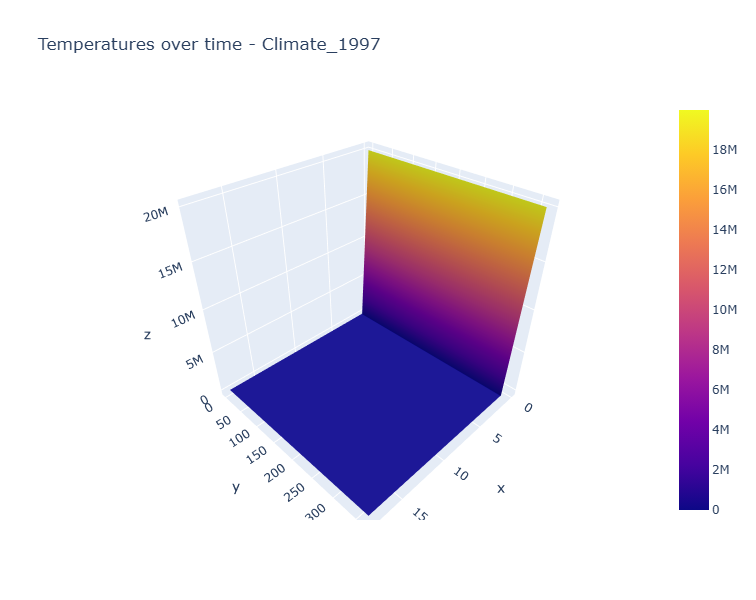

In [114]:
# Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=climate_1997_df.values)])
fig.update_layout(title='Temperatures over time - Climate_1997', autosize=False,
                  width=600, height=600)
fig.show()

In [116]:
fig.write_image("Temperatures over time - 3D Surface Plot - Climate_1997.png")

In [117]:
# We need to make an index for the year(1997). Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
# 1997 is not a leap year
# We'll scale this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [118]:
n_rows = climate_1997_df.shape[0]
n_rows

365

In [122]:
# This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)

# Represent x_0 as a vector of 1s for vector computation

ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=climate_1997_df['OSLO_temp_mean'].to_numpy().reshape(n_rows,1) 

In [124]:
X.shape, y.shape

((365, 2), (365, 1))

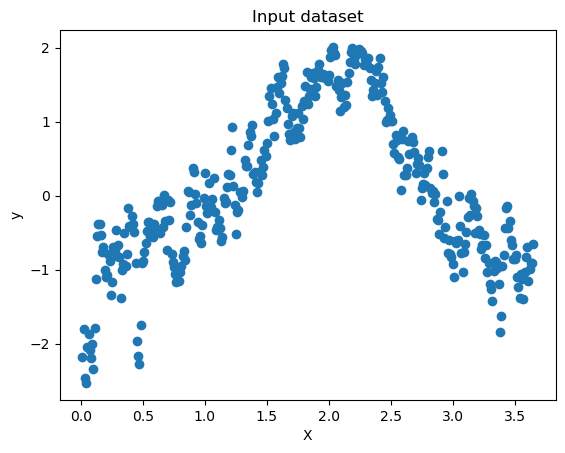

In [126]:
# Look at one year of temperature data over time

plt.scatter(x=index['index'], y=climate_1997_df['OSLO_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');
plt.savefig("Temperature over time - Scatter OSLO1997.png")
plt.show()

In [128]:
# What is the min temperature? (Note gradient descent is not actually finding this number)

climate_1997_df['OSLO_temp_mean'].min()

-2.528601321304413

In [130]:
# What is the max temperature? (Note gradient descent is not actually finding this number)
climate_1997_df['OSLO_temp_mean'].max()

2.009833473400747

In [132]:
# This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [134]:
compute_cost(X,y)

array([0.5539438])

In [136]:
# This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        
        term_vector = np.array([[term0],[term1]])
        
        #print(term_vector)
        
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [138]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=20 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-5],[-5]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 15.6 ms
Wall time: 7 ms


In [140]:
theta

array([[-1.62958335],
       [ 0.78337853]])

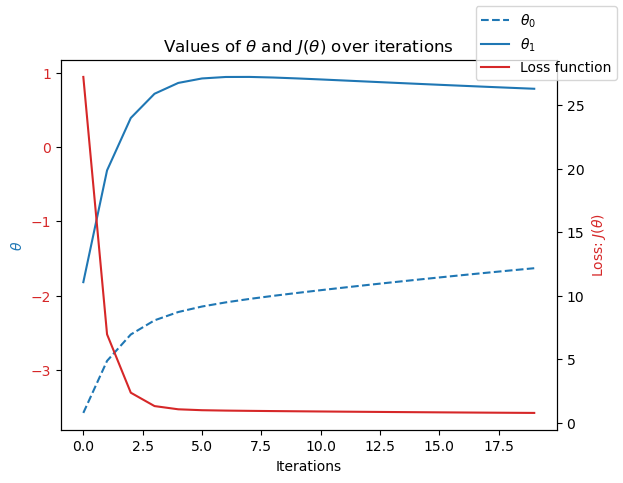

In [142]:
# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time

color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.savefig("Loss Function - OSLO1997.png")
plt.show()

In [144]:
%%time
# theta range
theta0_vals = np.linspace(-4,2.5,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-2,2.5,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta

c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 1.09 s
Wall time: 1.08 s


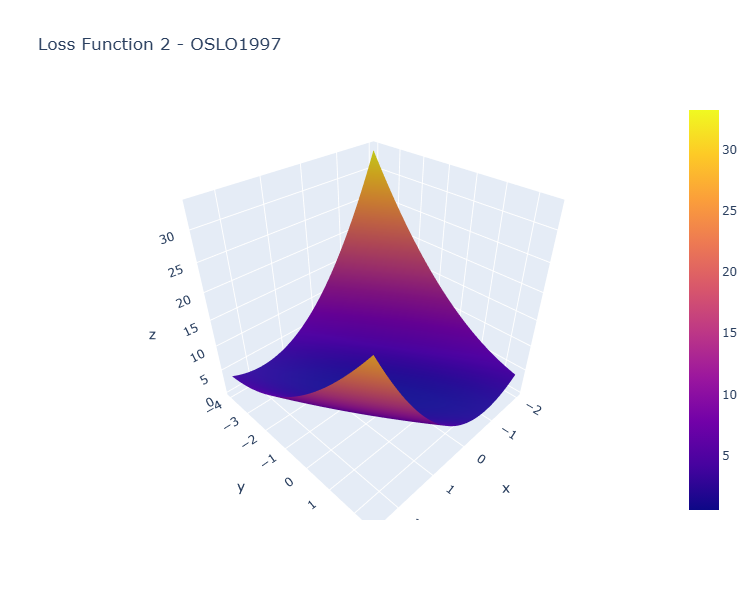

In [146]:
# This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
# Find where it is closest to 0 in X and Y!

# You can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss Function 2 - OSLO1997', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.write_image("Loss Function 2 - OSLO1997.png")
fig.show()

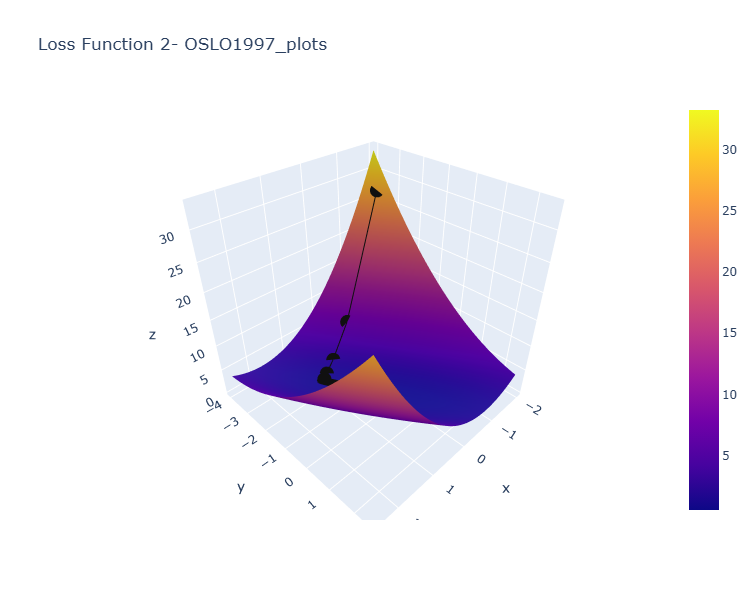

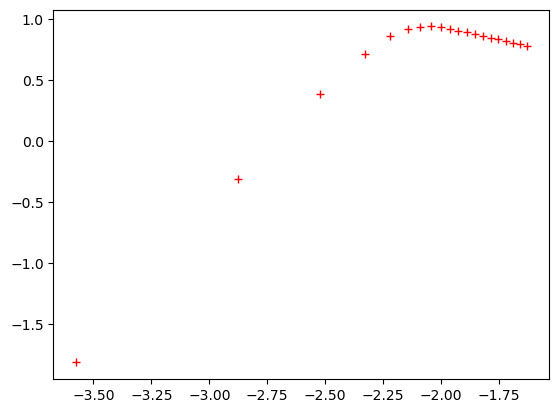

In [148]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss Function 2- OSLO1997_plots', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.write_image("Loss Function 2- OSLO1997_plots.png")
fig.show()

In [150]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=3 #<---start with the same iterations as above
theta_init=np.array([[0.13],[-0.12]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

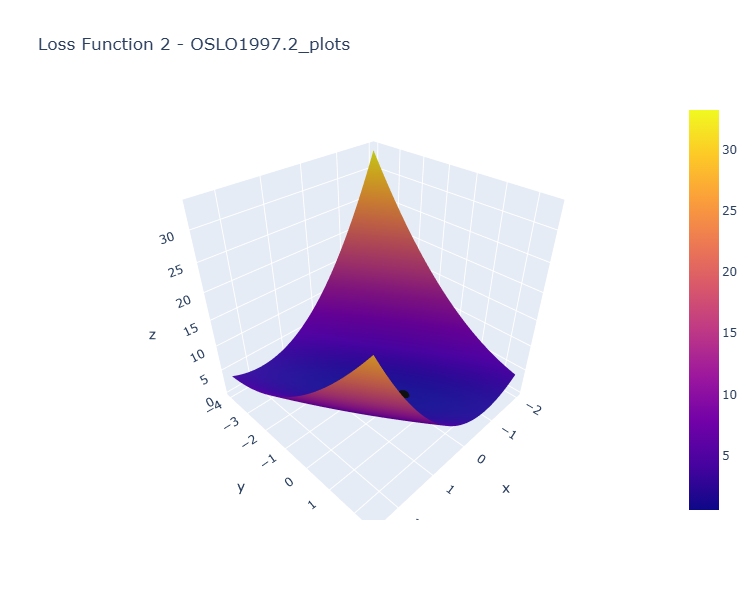

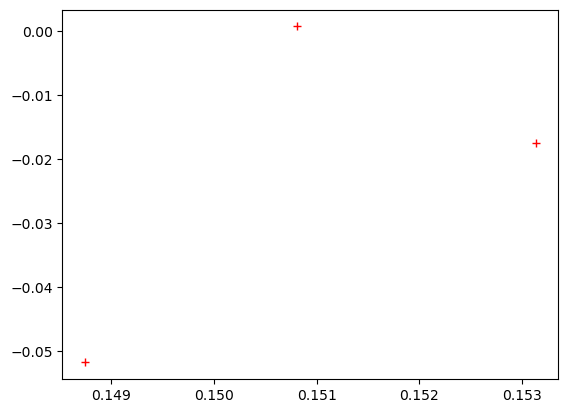

In [152]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss Function 2 - OSLO1997.2_plots', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.write_image("Loss Function 2 - OSLO1997.2_plots.png")
fig.show()

##### We are now closer to the zero point

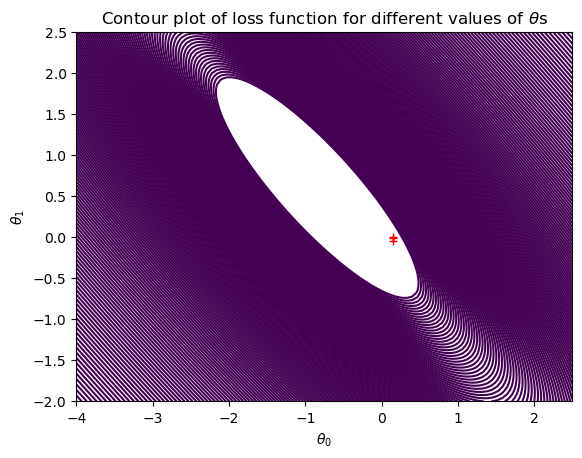

In [155]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.savefig("Contour plot of loss function - OSLO1997")
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()

### 3c. Gradient Descent (VALENTIA/2022)

In [158]:
# Reducing dataset to a single year

climate_2022 = mean_temps_datemonth[mean_temps_datemonth['DATE'].astype(str).str.contains('2022')]

In [160]:
climate_2022

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
781,19620220,-1.309570,-1.166914,-1.039574,-0.769788,-0.589023,-0.650721,-0.582315,-0.735435,-0.374868,-0.947009,-0.742216,-0.610866,-1.032352,-0.247249,-1.330965,-0.475333,-0.739408,-1.010327,-0.457920
782,19620221,-1.309570,-1.085430,-1.107669,-0.899185,-0.889645,-0.959981,-1.106638,-1.049918,-0.921230,-0.910682,-0.967261,-0.745657,-1.007217,-0.805452,-0.994201,-0.592334,-1.286794,-1.073078,-1.419269
783,19620222,-1.309570,-1.411366,-1.459493,-1.228561,-1.633290,-1.475413,-1.464712,-1.539113,-1.526658,-1.286061,-1.567383,-0.920885,-1.447075,-1.400060,-0.893171,-1.674591,-1.647571,-1.355455,-1.779775
784,19620223,-1.309570,-1.533592,-1.765920,-1.593226,-1.759868,-1.593226,-1.004331,-1.713826,-1.526658,-1.564568,-1.702411,-0.947843,-1.660721,-0.963205,-1.482509,-2.201094,-1.460962,-1.904522,-1.659606
785,19620224,-1.309570,-1.859527,-1.697825,-1.675570,-1.728223,-1.666859,-1.515865,-1.364400,-1.556191,-1.516132,-1.717414,-0.961322,-1.748692,-0.441407,-1.920302,-1.996343,-1.261913,-1.857459,-2.080197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,1.013583,0.747959,0.628750,-0.005167,0.898267,1.042841,0.440753,0.906865,-0.005705,0.481853,1.268193,0.683127,0.664244,0.395898,-0.000746,0.826301,0.517090,1.295755,-0.007287
22946,20221028,1.013583,0.856604,0.367720,-0.005167,0.945734,1.278467,0.466330,0.802037,-0.005705,0.263891,1.313202,0.561815,0.890456,0.541516,-0.000746,1.074927,0.641496,1.358505,-0.007287
22947,20221029,1.013583,0.856604,0.083991,-0.005167,0.914089,1.101748,0.786039,0.924336,-0.005705,0.300218,1.208181,0.548336,1.053832,0.395898,-0.000746,1.221178,0.716139,1.405568,-0.007287
22948,20221030,1.013583,0.680055,0.265577,-0.005167,0.692578,0.880848,0.376811,0.697210,-0.005705,0.397090,0.923123,0.103526,0.689378,-0.065226,-0.000746,1.235803,0.019467,0.668249,-0.007287


##### Here I run into an issue with the code pulling dates that aren't specifically 2022. I used Gemini AI to explain why I couldn't use '2022**' in part of my code (python doesn't read ** as special wild-cards like excel does). Instead of using str.contains() I'll manipulate my dataset so that python reads DATE as datetime (YYYYMMDD).

In [163]:
# Changing DATE to datetime data type

mean_temps_datemonth['DATE'] =pd.to_datetime(mean_temps_datemonth['DATE'], format='%Y%m%d')

In [165]:
# Rerunning code to reducing dataset to a single year

climate_2022 = mean_temps_datemonth[mean_temps_datemonth['DATE'].astype(str).str.contains('2022')]

In [167]:
climate_2022.head()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22646,2022-01-01,-1.599964,-0.569365,-0.301880,-0.005167,0.360311,0.306510,-0.326548,0.487554,-0.005705,-1.043881,0.323001,-0.516512,-0.064664,-1.060284,-0.000746,0.533799,-0.950898,-0.335759,-0.007287
22647,2022-01-02,-1.599964,-0.542204,-0.131643,-0.005167,0.265378,0.100337,-0.160300,0.033301,-0.005705,-1.128644,0.217980,-0.691740,0.061010,-0.744778,-0.000746,0.738550,-0.590121,-0.100445,-0.007287
22648,2022-01-03,-1.599964,0.123248,-0.335927,-0.005167,-0.051067,-0.150016,-0.083570,-0.246239,-0.005705,-0.668502,-0.157097,-0.705220,0.161549,-0.647699,-0.000746,0.007295,-0.378632,0.025056,-0.007287
22649,2022-01-04,-1.599964,0.163990,-0.279182,-0.005167,-0.557378,-0.577088,-0.364913,-0.613136,-0.005705,-0.147815,-0.607188,-0.853490,0.186683,-1.096689,-0.000746,-0.124331,-0.751849,-0.178883,-0.007287
22650,2022-01-05,-1.599964,-0.990365,0.152086,-0.005167,-0.778890,-1.018887,-0.722987,-1.294515,-0.005705,-0.511085,-1.057280,-1.123071,-0.894111,-1.072419,-0.000746,-0.928711,-1.125066,-1.182891,-0.007287


In [169]:
climate_2022.shape

(304, 20)

In [171]:
# Decide which weather station to use and create a 3d Model of temperatures for that year.
# Drop MONTH as it is not scaled and not necessary. Keep DATE for my selected year of 2022. My selected weather
# station will be Oslo.

climate_2022_df = climate_2022.drop('MONTH', axis = 1)

In [173]:
climate_2022_df.head()

,DATE,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22646,2022-01-01,-0.569365,-0.301880,-0.005167,0.360311,0.306510,-0.326548,0.487554,-0.005705,-1.043881,0.323001,-0.516512,-0.064664,-1.060284,-0.000746,0.533799,-0.950898,-0.335759,-0.007287
22647,2022-01-02,-0.542204,-0.131643,-0.005167,0.265378,0.100337,-0.160300,0.033301,-0.005705,-1.128644,0.217980,-0.691740,0.061010,-0.744778,-0.000746,0.738550,-0.590121,-0.100445,-0.007287
22648,2022-01-03,0.123248,-0.335927,-0.005167,-0.051067,-0.150016,-0.083570,-0.246239,-0.005705,-0.668502,-0.157097,-0.705220,0.161549,-0.647699,-0.000746,0.007295,-0.378632,0.025056,-0.007287
22649,2022-01-04,0.163990,-0.279182,-0.005167,-0.557378,-0.577088,-0.364913,-0.613136,-0.005705,-0.147815,-0.607188,-0.853490,0.186683,-1.096689,-0.000746,-0.124331,-0.751849,-0.178883,-0.007287
22650,2022-01-05,-0.990365,0.152086,-0.005167,-0.778890,-1.018887,-0.722987,-1.294515,-0.005705,-0.511085,-1.057280,-1.123071,-0.894111,-1.072419,-0.000746,-0.928711,-1.125066,-1.182891,-0.007287


In [175]:
climate_2022_df.shape

(304, 19)

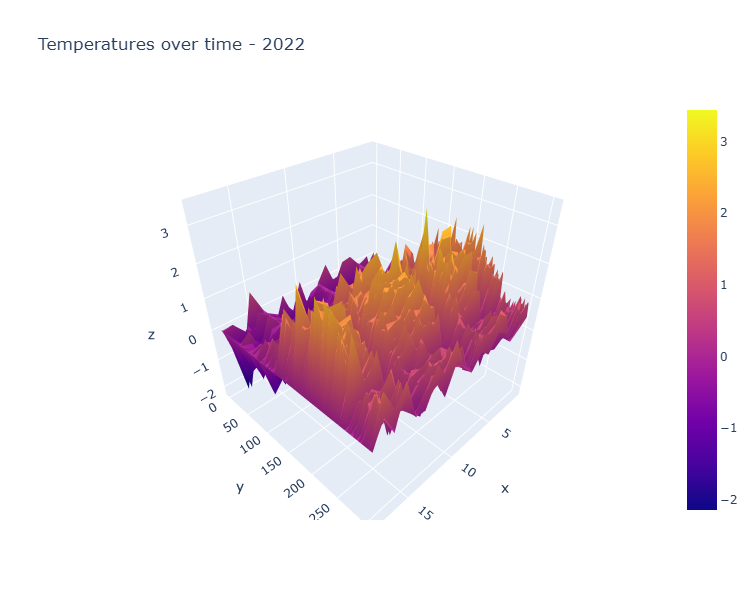

In [177]:
# Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=climate_2022_df.values)])
fig.update_layout(title='Temperatures over time - 2022', autosize=False,
                  width=600, height=600)
fig.show()

In [178]:
fig.write_image("Temperatures over time - 3D Surface Plot - 2022.png")

##### The image above shows that there is an obvious line running down '0'. To interpret this, it appears that have been lower temperatures that have become elevated over time.

##### The image above shows that there is an obvious line running down '0'. To interpret this, it appears that have been lower temperatures that have become elevated over time.

In [183]:
# We need to make an index for the year(2022). Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
# 2022 is not a leap year
# We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.05,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
299,3.00
300,3.01
301,3.02
302,3.03


In [185]:
n_rows = climate_2022_df.shape[0]
n_rows

304

In [187]:
# This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)

# Represent x_0 as a vector of 1s for vector computation

ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=climate_2022_df['VALENTIA_temp_mean'].to_numpy().reshape(n_rows,1)

In [189]:
X.shape, y.shape

((304, 2), (304, 1))

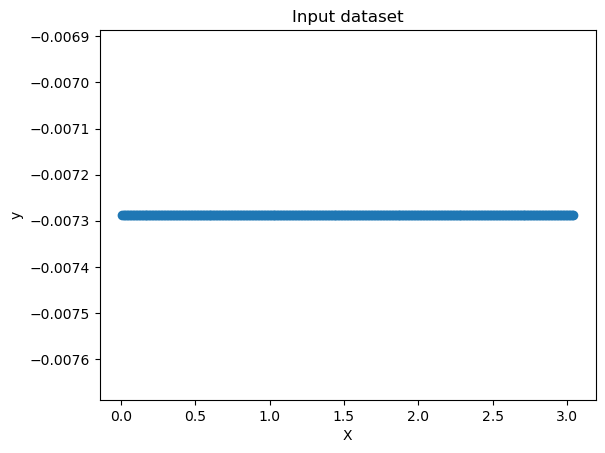

In [191]:
# Look at one year of temperature data over time

plt.scatter(x=index['index'], y=climate_2022_df['VALENTIA_temp_mean'])
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');
plt.savefig("Temperature over time - VALENTIA2022.png")
plt.show()

In [193]:
# What is the min temperature? (Note gradient descent is not actually finding this number)

climate_2022_df['VALENTIA_temp_mean'].min()

-0.0072873521422696

In [195]:
# What is the max temperature? (Note gradient descent is not actually finding this number)
climate_2022_df['VALENTIA_temp_mean'].max()

-0.0072873521422696

##### Both the Min and Max are the exact same number. Let's look at our data frame again.

In [198]:
climate_2022_df.head(50)

,DATE,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22646,2022-01-01,-0.569365,-0.301880,-0.005167,0.360311,0.306510,-0.326548,0.487554,-0.005705,-1.043881,0.323001,-0.516512,-0.064664,-1.060284,-0.000746,0.533799,-0.950898,-0.335759,-0.007287
22647,2022-01-02,-0.542204,-0.131643,-0.005167,0.265378,0.100337,-0.160300,0.033301,-0.005705,-1.128644,0.217980,-0.691740,0.061010,-0.744778,-0.000746,0.738550,-0.590121,-0.100445,-0.007287
22648,2022-01-03,0.123248,-0.335927,-0.005167,-0.051067,-0.150016,-0.083570,-0.246239,-0.005705,-0.668502,-0.157097,-0.705220,0.161549,-0.647699,-0.000746,0.007295,-0.378632,0.025056,-0.007287
22649,2022-01-04,0.163990,-0.279182,-0.005167,-0.557378,-0.577088,-0.364913,-0.613136,-0.005705,-0.147815,-0.607188,-0.853490,0.186683,-1.096689,-0.000746,-0.124331,-0.751849,-0.178883,-0.007287
22650,2022-01-05,-0.990365,0.152086,-0.005167,-0.778890,-1.018887,-0.722987,-1.294515,-0.005705,-0.511085,-1.057280,-1.123071,-0.894111,-1.072419,-0.000746,-0.928711,-1.125066,-1.182891,-0.007287
22651,2022-01-06,-1.194075,-0.926083,-0.005167,-1.000401,-1.151427,-1.004331,-1.626469,-0.005705,-1.213407,-1.147298,-1.419611,-1.044919,-1.485004,-0.000746,-1.733091,-1.660011,-1.355455,-0.007287
22652,2022-01-07,-1.261978,-1.164415,-0.005167,-1.000401,-1.077794,-1.208945,-1.294515,-0.005705,-1.576677,-1.042277,-1.257862,-1.271132,-1.327251,-0.000746,-1.513715,-1.523165,-0.790700,-0.007287
22653,2022-01-08,-0.813817,-1.243859,-0.005167,-1.126979,-1.239786,-1.004331,-1.049918,-0.005705,-1.770421,-1.057280,-1.500486,-1.057487,-1.157363,-0.000746,-1.601465,-0.888695,-0.476948,-0.007287
22654,2022-01-09,-0.854559,-1.368700,-0.005167,-0.858001,-0.945254,-1.298463,-1.032446,-0.005705,-1.552459,-0.952258,-0.934364,-0.856409,-0.951071,-0.000746,-1.542965,-0.938458,-0.665199,-0.007287
22655,2022-01-10,-1.153333,-1.572984,-0.005167,-1.316845,-1.387053,-1.477500,-0.980032,-0.005705,-1.213407,-1.492368,-0.503033,-0.956948,-0.914666,-0.000746,-1.659965,-1.087745,-0.743637,-0.007287


##### It would appear all the temperature readings for 2022 in Valentia are scaled at 0.007287. We'll choose another weather station to observe.

### 3d. Gradient Descent (DEBILT/2022)

##### We will look at weather station in year 2022 to keep things consistent with the previous codes run above for Valentia.

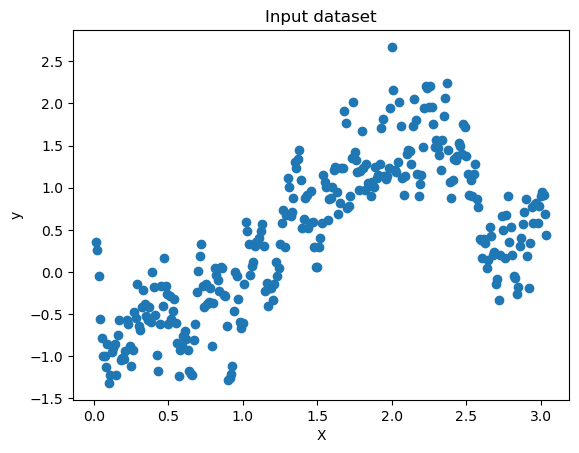

In [200]:
# Look at one year of temperature data over time

plt.scatter(x=index['index'], y=climate_2022_df['DEBILT_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');
plt.savefig("Temperature over time - DEBILT2022.png")
plt.show()

In [202]:
# What is the min temperature? (Note gradient descent is not actually finding this number)

climate_2022_df['DEBILT_temp_mean'].min()

-1.3168453728263665

In [204]:
# What is the max temperature? (Note gradient descent is not actually finding this number)

climate_2022_df['DEBILT_temp_mean'].max()

2.670356957349672

In [206]:
# This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [208]:
compute_cost(X,y)

array([2.65527506e-05])

In [210]:
# This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        
        term_vector = np.array([[term0],[term1]])
        
        #print(term_vector)
        
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [212]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=10 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-7],[-10]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 31.2 ms
Wall time: 3.5 ms


In [214]:
theta

array([[-1.15792439],
       [ 0.50758258]])

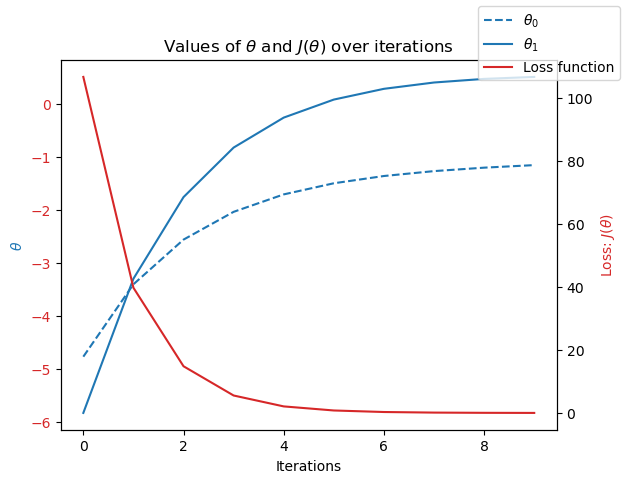

In [216]:
# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time

color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.savefig("Loss Function - DEBILT2022.png")
plt.show()

In [218]:
%%time
# theta range
theta0_vals = np.linspace(-5.1,3,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-6,4,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta

c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 891 ms
Wall time: 903 ms


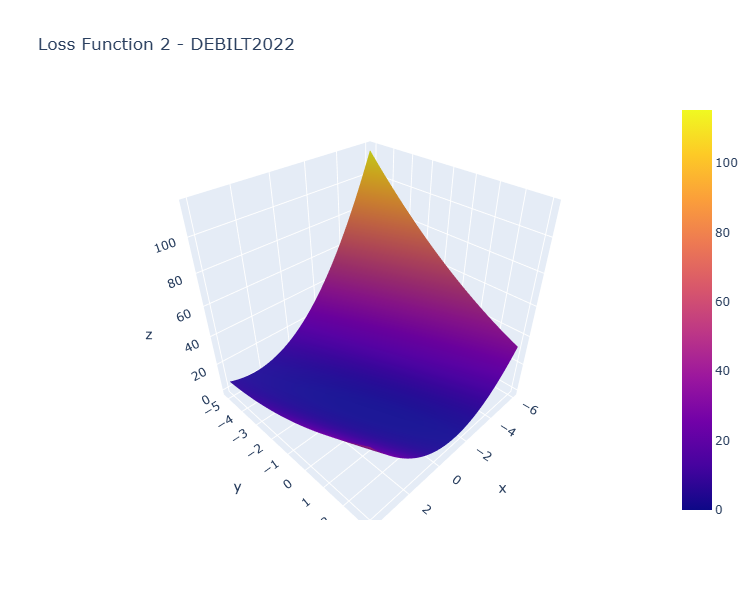

In [219]:
# This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
# Find where it is closest to 0 in X and Y!

# You can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss Function 2 - DEBILT2022', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.write_image("Loss Function 2 - DEBILT2022.png")
fig.show()

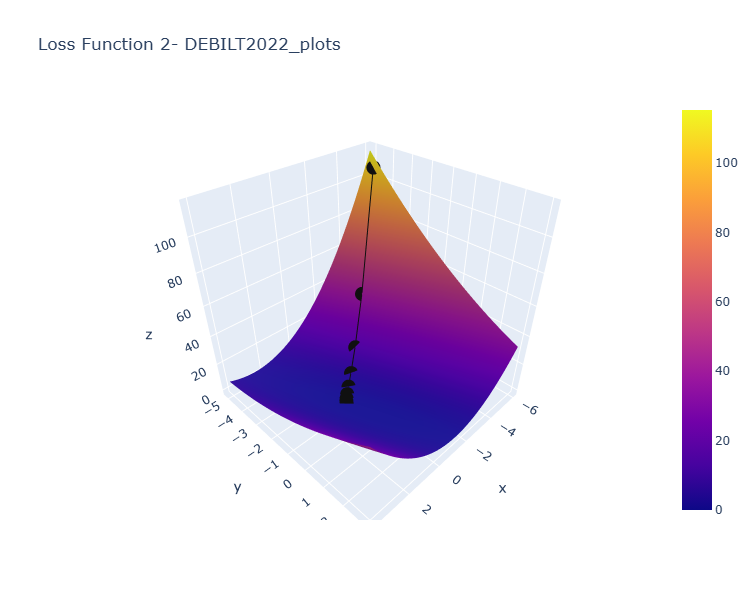

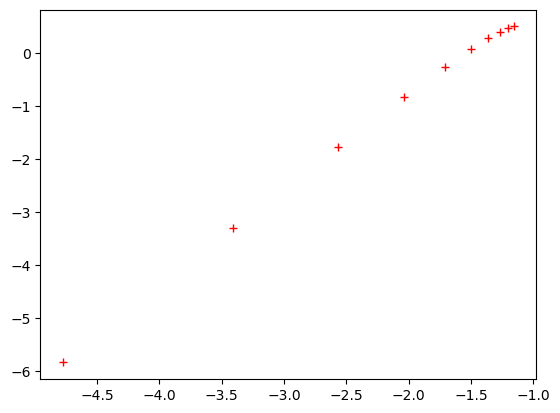

In [222]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss Function 2- DEBILT2022_plots', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.write_image("Loss Function2 - DEBILT2022_plots.png")
fig.show()

##### The closest point to 0 for the X and y points are: X = -0.04040404, y =0.05454545, z = 628.6328u

In [225]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=5 #<---start with the same iterations as above
theta_init=np.array([[-0.04],[0.05]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

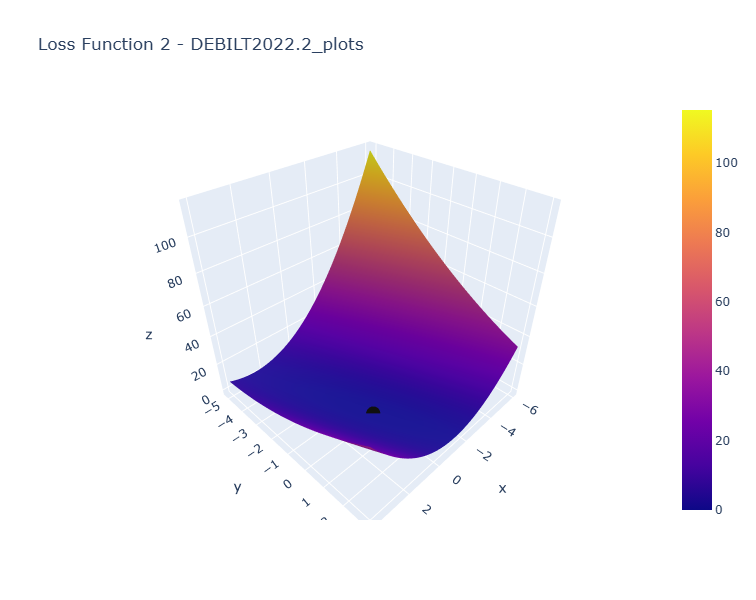

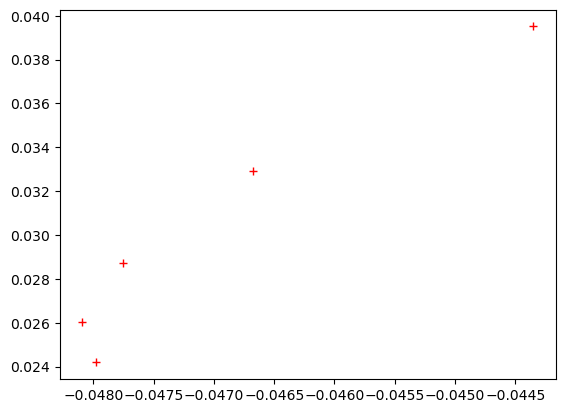

In [227]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss Function 2 - DEBILT2022.2_plots', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.write_image("Loss Function 2 - DEBILT2022.2_plots.png")
fig.show()

##### The original plotted image was very close to zero.

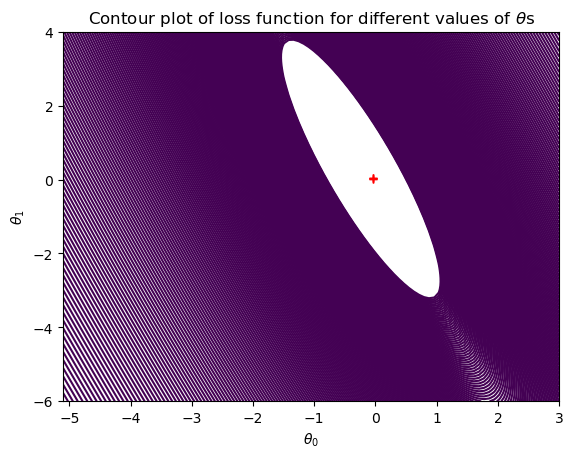

In [229]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.savefig("Contour plot of loss function - DEBILT2022.png")
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()

##### In each of the gradient models I was able to find the converging '0'. Valentia was the only weather station that didn't have a variety of data for the year I picked (2022) and couldn't be further analyzed.

### 4. Exporting

In [232]:
climatewins_df.to_pickle(os.path.join(path, 'ClimateWins', 'Prepared Python Files', 'ML1_1.3_scaled_og_DATE_column_part 2.pkl'))